# FUSE workshop — D3D Summer School

One notebook, the whole workshop: an idealized DIII-D run, a constrained
multi-objective optimization (CMOOP), its analysis, the audience challenge,
and the public EPED API.

- FUSE docs: https://fuse.help — FPP database explorer: https://fuseexplorer.com
- EPED explorer + API: https://iter.fuseexplorer.com/EPED

*Kernel: Julia FUSE 1.12 (project preset — just run the cells).*


> **Note on data:** the run databases this notebook reads (`../runs/d3d_cmoop_summerschool`,
> `../runs/d3d_cmoop_big`, ...) are not included in the repository — they are a few GB of
> FUSE simulation output. If you would like them to play with, email
> **tslendebroek@ucsd.edu** and I'll happily share them.


# Idealized DIII-D: a single FUSE run

This is the starting point for the CMOOP study in `02_d3d_cmoop.jl`:
one self-consistent stationary DIII-D simulation, so we understand what
the optimizer will be running hundreds of times.

Run with:  julia --project=../FUSE

The two core input structures in FUSE:
  ini — "how do we start"  : machine description + initial plasma guesses
  act — "how do we model"  : the knobs of every actor (model choices, settings)
and everything lives in `dd`, the IMAS data dictionary.


In [1]:
using Plots
using FUSE


## Load the idealized DIII-D case

`:default` loads the DIII-D machine description + an equilibrium ODS,
and (since there are no experimental profiles/sources) sets up an
idealized plasma: 3 neutral beams (co / counter / off-axis), 1 EC
launcher, Zeff=2 with carbon impurity.


In [2]:
ini, act = FUSE.case_parameters(:D3D, :default);

# Have a look around — ini is organized in sections;
# highlighted are the ones we'll play with today:
for name in keys(ini)
    if name in (:equilibrium, :core_profiles)
        printstyled("  ▶ ini.", name, "\n"; bold=true, color=:cyan)
    else
        println("    ini.", name)
    end
end

# ...and each section prints nicely:
ini.equilibrium
ini.core_profiles



    ini.general
    ini.time
    ini.ods
  ▶ ini.equilibrium
  ▶ ini.core_profiles
    ini.pf_active
    ini.rampup
    ini.nb_unit
    ini.ec_launcher
    ini.pellet_launcher
    ini.ic_antenna
    ini.lh_antenna
    ini.hcd
    ini.build
    ini.center_stack
    ini.tf
    ini.oh
    ini.bop
    ini.requirements


core_profiles
├─ plasma_mode{Symbol} ➡ :H_mode Plasma configuration [:H_mode, :L_mode]
├─ w_ped{Float64} ➡ 0.05 Pedestal full width expressed in fraction of rho_tor_norm (NOTE: different from EPED 1/2 width as
│  fraction of psi)
├─ ne_value{Float64} ➡ 0.5625 Value based on setup method
├─ ne_setting{Symbol} ➡ :greenwald_fraction_ped Way to set the electron density [:ne_ped, :ne_line, :greenwald_fraction,
│  :greenwald_fraction_ped]
├─ ne_sep_to_ped_ratio{Float64} ➡ 0.25 Ratio used to set the sepeartrix density based on the pedestal density
├─ ne_core_to_ped_ratio{Float64} ➡ 1.4 Ratio used to set the core density based on the pedestal density
├─ ne_shaping{Float64} ➡ 0.9 Density shaping factor
├─ Ti_Te_ratio{Float64} ➡ 1.0 Ti/Te ratio
├─ Te_shaping{Float64} ➡ 1.8 Temperature shaping factor
├─ Te_sep{Float64} ➡ 80.0 [eV] Separatrix temperature
├─ Te_ped{Float64} ➡ missing Pedestal temperature
├─ Te_core{Float64} ➡ missing Core temperature (NOTE: `Te_core` can be calculated from `ini.equ

## Modify ini — the physics starting point


In [3]:
ini.equilibrium.ip = 1.0E6        # plasma current [A]
ini.core_profiles.zeff = 2.0      # effective charge
ini.core_profiles.impurity = :C   # seeding impurity species

# density: absolute pedestal density (kept low to stay clear of the EC cutoff)
ini.core_profiles.ne_setting = :ne_ped
ini.core_profiles.ne_value = 4.0e19

ini.core_profiles.Te_core = 1.5e3
ini.core_profiles.Te_ped = 1e3



1000.0

## Modify act — the models


In [4]:
act.ActorEquilibrium.model = :TEQUILA

# Aim the EC deposition location (this is an `act` parameter — the actuator
# aiming — not an `ini` parameter):
for actuator in act.ActorSimpleEC.actuator
    actuator.rho_0 = 0.1
end

# Pedestal from EPED, not evolved by the transport solver:
act.ActorPedestal.model = :EPED
act.ActorFluxMatcher.evolve_pedestal = false

# This is the TGLF NN that we use:
act.ActorTGLF.tglfnn_model = "sat3_em_d3d+mastu+nstx_azf-1"

# If instead you want to run the full TGLF model then:
#
# act.ActorTGLF.model = :TJLF # Julia version of TGLF


"sat3_em_d3d+mastu+nstx_azf-1"

# Make sure to run less of it!
act.ActorFluxMatcher.max_iterations = 50

But we are not going to run with the full model as that would take too long


## Initialize: ini → dd


actors: CXbuild
actors: Sources
actors:  SimpleEC
actors:  SimpleNB
actors:  NeutralFueling


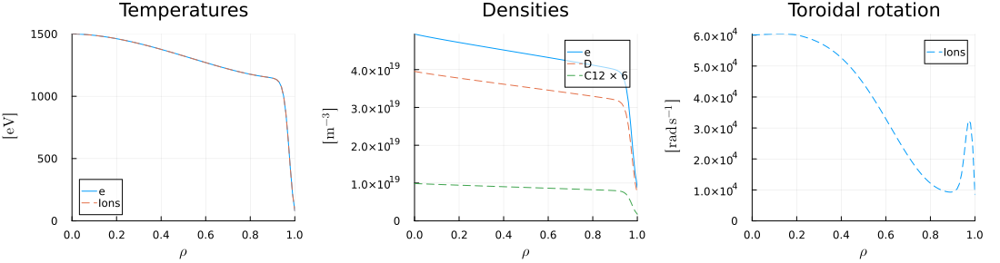

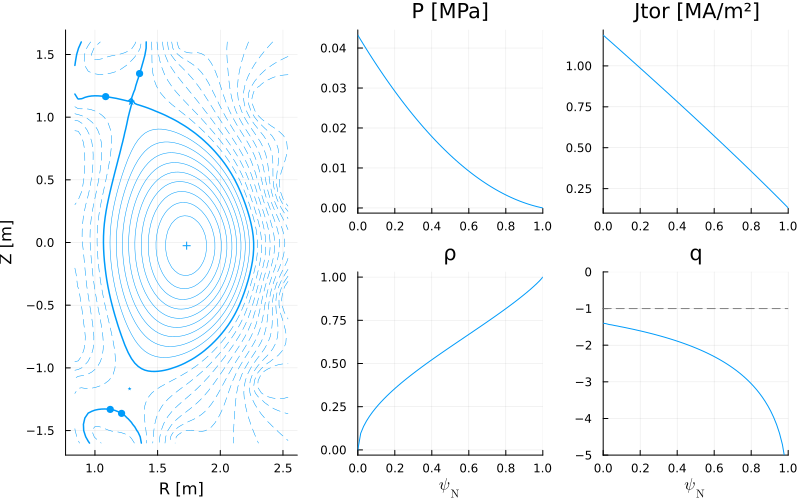

In [5]:
dd = IMAS.dd();
FUSE.init(dd, ini, act);

eq_plot_init = plot(dd.equilibrium)
core_profiles_plot_init = plot(dd.core_profiles)

display(core_profiles_plot_init)
display(eq_plot_init)



## Run the stationary plasma

DIII-D already exists — no need for the power-plant machinery that
ActorWholeFacility would drag in (sizing, blanket, balance of plant,
costing...). ActorStationaryPlasma iterates
equilibrium ⇄ transport ⇄ sources ⇄ current
to a self-consistent stationary solution:


actors: StationaryPlasma
actors:  --------------- 1/5
actors:  Sources
actors:   SimpleEC
actors:   SimpleNB
actors:   NeutralFueling
actors:  Pedestal
actors:   EPED
actors:  CoreTransport
actors:   FluxMatcher
actors:    FluxCalculator
actors:     TGLF
actors:     Neoclassical
actors:  Current
actors:   QED
actors:  SawteethSource
actors:  Equilibrium
actors:   TEQUILA
actors:  --------------- 1/5 @ 905.40%
actors:  Sources
actors:   SimpleEC
actors:   SimpleNB
actors:   NeutralFueling
actors:  Pedestal
actors:   EPED
actors:  CoreTransport
actors:   FluxMatcher
actors:    FluxCalculator
actors:     TGLF
actors:     Neoclassical
actors:  Current
actors:   QED
actors:  SawteethSource
actors:  Equilibrium
actors:   TEQUILA
actors:  --------------- 2/5 @ 603.13%
actors:  Sources
actors:   SimpleEC
actors:   SimpleNB
actors:   NeutralFueling
actors:  Pedestal
actors:   EPED
actors:  CoreTransport
actors:   FluxMatcher
actors:    FluxCalculator
actors:     TGLF
actors:     Neoclassical
ac

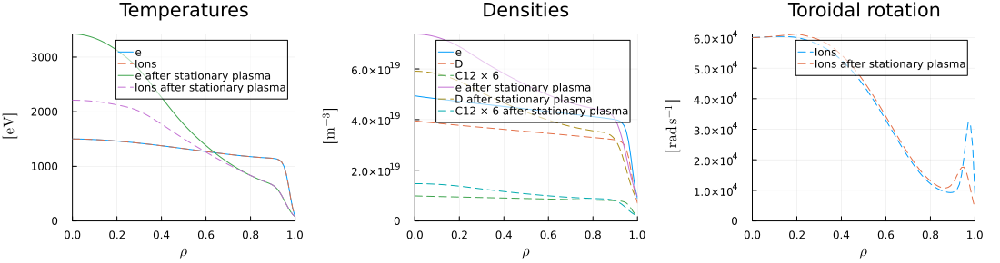

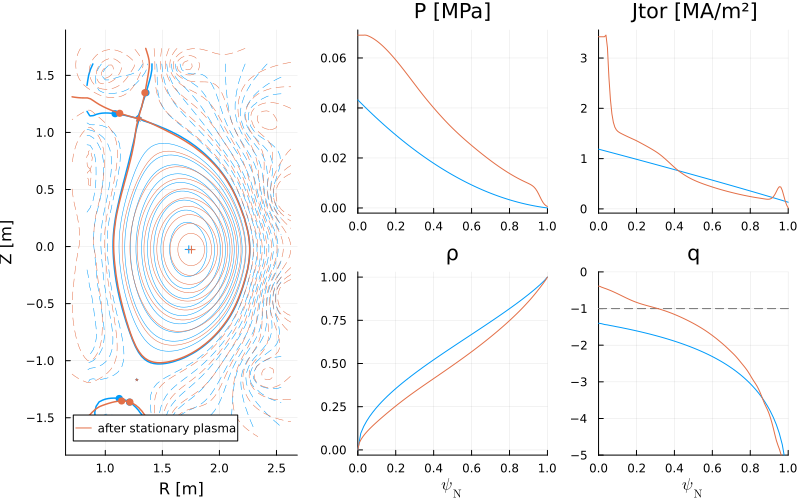

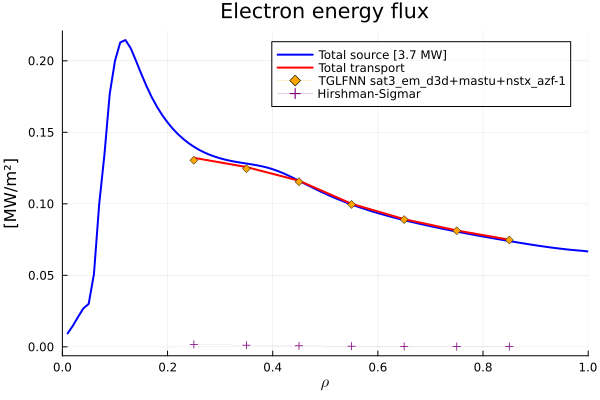

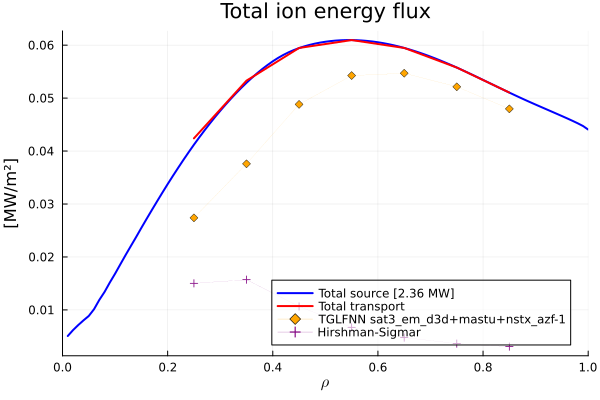

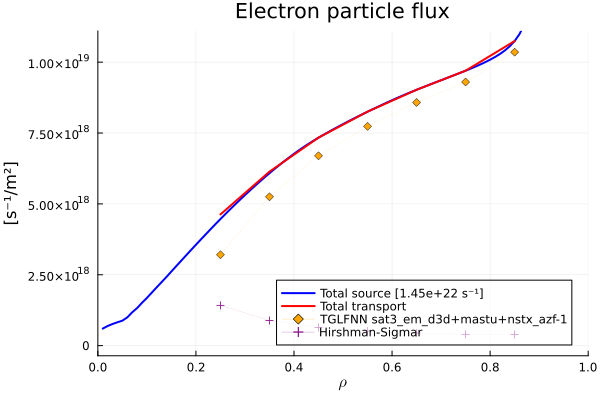

In [6]:
FUSE.ActorStationaryPlasma(dd, act);

# before vs after:
display(plot!(core_profiles_plot_init, dd.core_profiles, label=" after stationary plasma"))
display(plot!(eq_plot_init, dd.equilibrium, label=" after stationary plasma"))

# Transport fluxes versus source for the Electron energy, Ion energy and electron particle flux
display(plot(dd.core_transport; only=1))
display(plot(dd.core_transport; only=2))
display(plot(dd.core_transport; only=3))

# what is our beta_normal?

In [7]:
IMAS.extract(dd)

GEOMETRY                               EQUILIBRIUM                            TEMPERATURES                           
───────────────────────────────────    ───────────────────────────────────    ───────────────────────────────────    
R0 → 1.67 [m]                          B0 → -1.71 [T]                         Te0 → 3.42 [keV]                       
a → 0.599 [m]                          ip → 0.984 [MA]                        Ti0 → 2.21 [keV]                       
1/ϵ → 2.78                             q95 → -4.79                            <Te> → 1.39 [keV]                      
κ → 1.79                               <Bpol> → 0.226 [T]                     <Ti> → 1.17 [keV]                      
δ → 0.372                              βpol_MHD → 1.11                        Te0/<Te> → 2.46                        
ζ → -0.121                             βtor_MHD → 0.0206                      Ti0/<Ti> → 1.89                        
Volume → 18.8 [m³]                     βn_MHD → 2.13    

## Operational limits (the stability NN!)

Let's see if our idealized run stays within the no-wall limit with TroyonBetaNN.
For each toroidal mode number n=1,2,3 it predicts the no-wall βₙ limit for
THIS equilibrium shape and profiles. `fraction` = βₙ / βₙ_limit, so
fraction < 1 means stable.

TroyonBetaNN is trained by CHEASE and MarsF  [Y.Q. Liu, et al., PPCF (2020)]


In [8]:
act.ActorPlasmaLimits.models = [:beta_troyon_nn]
act.ActorPlasmaLimits.verbose = true
FUSE.ActorPlasmaLimits(dd, act);



actors: PlasmaLimits
actors:  TroyonBetaNN


act.ActorPlasmaLimits.models = [:beta_troyon_nn]

Some stability rules satisfy their limit threshold:
 64% of: βn < BetaTroyonNN n=1
 44% of: βn < BetaTroyonNN n=2
 48% of: βn < BetaTroyonNN n=3


## Did the transport solver converge?


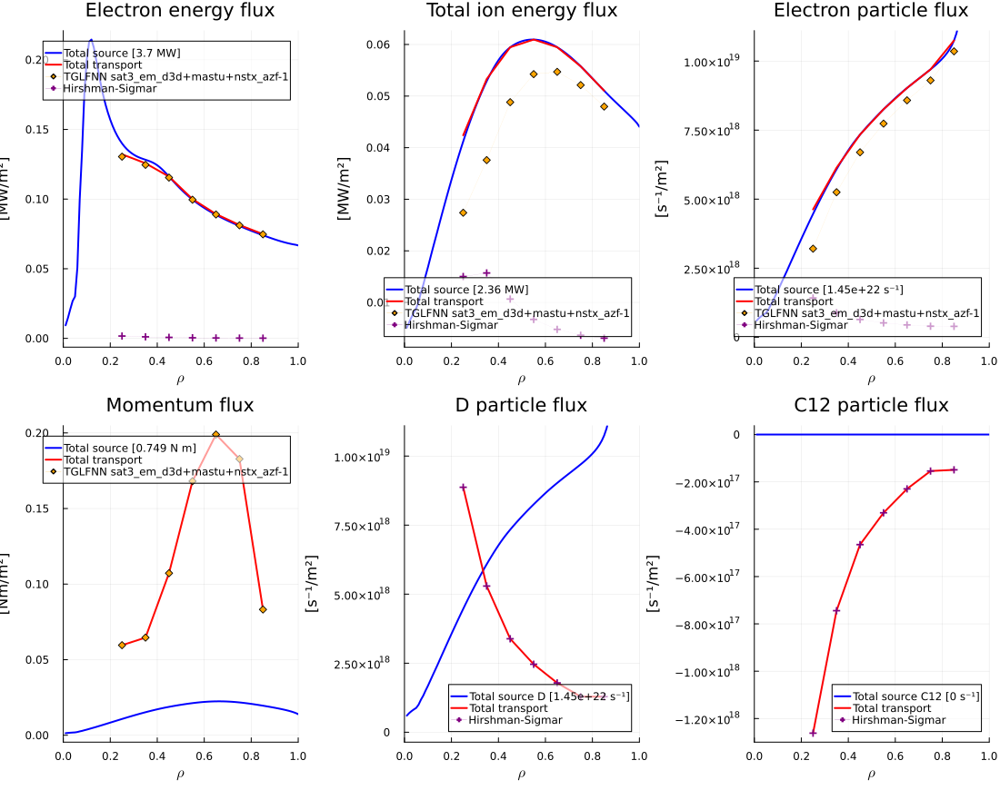

dd.transport_solver_numerics.convergence.time_step.data[1] = 4.810556065029565e-5


In [9]:
display(plot(dd.core_transport))

@show dd.transport_solver_numerics.convergence.time_step.data[1]


# This is the field we'll use as a constraint in the optimization to
# automatically reject unconverged runs:


# Save for later comparison:
file_name = joinpath(@__DIR__, "..", "runs", "d3d_single_run.json")



IMAS.imas2json(dd, file_name);


# An idealized DIII-D CMOOP

Constrained Multi-Objective Optimization: take the single run from
`01_d3d_single_run.jl`, declare some `ini` parameters as actuators
(with `↔` ranges), pick objectives and constraints, and let a genetic
algorithm (SPEA2) explore the operational space.

Run with:  julia --project=../FUSE
...or, with a sysimage (make_sysimage.jl — currently Linux only, see README):
           julia -J ../fuse_d3d.so --project=../FUSE
The CMOOP workers inherit the sysimage automatically (Distributed spawns
them with the master's julia command) — fast startup, shared image memory.


In [10]:
using FUSE
import IMAS
using Plots



## Start from the same idealized DIII-D


In [11]:
ini, act = FUSE.case_parameters(:D3D, :default);

# We're setting up act the same as before:
act.ActorPedestal.model = :EPED
act.ActorFluxMatcher.evolve_pedestal = false

# This is the TGLF NN that we use:
act.ActorTGLF.tglfnn_model = "sat3_em_d3d+mastu+nstx_azf-1"
act.ActorPlasmaLimits.models = [:beta_troyon_nn]
act.ActorEquilibrium.model = :TEQUILA



:TEQUILA

## Turn ini parameters into actuators

`value ↔ [lower, upper]` declares an optimization range;
`value ↔ (choice1, choice2)` declares a categorical choice.
Anything with a `↔` becomes a gene of the optimizer — everything else stays fixed.


In [12]:
# plasma current
ini.equilibrium.ip = ini.equilibrium.ip ↔ [0.6E6, 1.5E6]

# heating & current drive: the three beamlines and the gyrotrons
ini.nb_unit[1].power_launched = ini.nb_unit[1].power_launched ↔ [0.1E6, 3.3E6]  # co
ini.nb_unit[2].power_launched = ini.nb_unit[2].power_launched ↔ [0.1E6, 3.3E6]  # counter
ini.nb_unit[3].power_launched = ini.nb_unit[3].power_launched ↔ [0.1E6, 3.3E6]  # off-axis
ini.ec_launcher[1].power_launched = ini.ec_launcher[1].power_launched ↔ [0.1E6, 4.5E6]

# EC deposition location: aiming is really an act parameter
# (act.ActorSimpleEC.actuator[].rho_0) and only ini parameters can carry ↔
# ranges — so the gene rides on ini.ec_launcher[].rho_0 and our custom
# workflow (cmoop_definitions.jl) maps it onto act before each run
ini.ec_launcher[1].rho_0 = 0.4 ↔ [0.1, 0.8]

# density and impurities — absolute pedestal density (not Greenwald fraction),
# kept low to stay clear of the EC cutoff
ini.core_profiles.ne_setting = :ne_ped
ini.core_profiles.ne_value = 4.0e19 ↔ [3.5e19, 4.5e19]                        # pedestal density [m⁻³]
ini.core_profiles.zeff = ini.core_profiles.zeff ↔ [1.5, 3.5]
ini.core_profiles.impurity = ini.core_profiles.impurity ↔ (:C, :Ne)             # categorical!

# more ideas:
# ini.core_profiles.ne_sep_to_ped_ratio = ini.core_profiles.ne_sep_to_ped_ratio ↔ [0.15, 0.5]



SimulationParameters.OptParameterChoice{Symbol}(:C, missing, missing, 1, [:C, :Ne])

## Requirements (used by some constraint functions)


In [13]:
ini.requirements.lh_power_threshold_fraction = 1.0   # stay in H-mode



1.0

## Objectives and constraints

The custom functions live in cmoop_definitions.jl — open it!
It defines: max_prad, max_βn, max_fni and the stable_troyon_nn constraint.


In [14]:
# (these definitions also live in cmoop_definitions.jl — that's the file the
#  CMOOP workers load, so keep the two in sync if you edit them here)

# Custom objective & constraint functions for the DIII-D CMOOP
#
# The stock libraries (IMAS.ObjectiveFunctionsLibrary / ConstraintFunctionsLibrary)
# are just collections of functions of `dd` — none of them talk about radiation
# or non-inductive fraction, so we define our own. Constructing an
# ObjectiveFunction/ConstraintFunction registers it in the library.
#
# NOTE: this file is `include`d on the master AND on every worker
# (via `@everywhere`) so that the workers can also evaluate these
# functions when building the results database.

import FUSE
import IMAS

# What the optimizer runs for every individual.
# DIII-D already exists, so no ActorWholeFacility (sizing, blanket, costing...):
# just the self-consistent stationary plasma + the operational limit models.
function d3d_stationary_workflow(ini::FUSE.ParametersAllInits, act::FUSE.ParametersAllActors)
    # act parameters are not scanned for ↔ optimization ranges — so the EC
    # aiming gene rides on ini (ini.ec_launcher[].rho_0) and we map it onto
    # the act-side actuator here, before running the actors
    for k in 1:min(length(ini.ec_launcher), length(act.ActorSimpleEC.actuator))
        if !ismissing(ini.ec_launcher[k], :rho_0)
            act.ActorSimpleEC.actuator[k].rho_0 = ini.ec_launcher[k].rho_0
        end
    end
    dd = IMAS.dd()
    FUSE.init(dd, ini, act)
    FUSE.ActorEquilibrium(dd,act;ip_from=:pulse_schedule);
    # the input ODS carried in ini.general.dd was only needed by init —
    # drop it so the per-case ini saved in the database is small and serializable
    ini.general.dd = missing
    FUSE.ActorStationaryPlasma(dd, act)
    FUSE.ActorPlasmaLimits(dd, act)
    return dd
end

IMAS.update_ObjectiveFunctionsLibrary!()
IMAS.update_ConstraintFunctionsLibrary!()

# maximize radiated power (radiative divertor operation)
# NB: IMAS convention — radiation sources are sinks, radiation_losses() < 0,
#     so the radiated power in positive MW is -radiation_losses()
IMAS.ObjectiveFunction(:max_prad, "MW",
    dd -> -IMAS.radiation_losses(dd.core_sources) / 1E6,
    Inf)

# maximize normalized beta (performance)
IMAS.ObjectiveFunction(:max_βn, "-",
    dd -> dd.equilibrium.time_slice[].global_quantities.beta_normal,
    Inf)

# maximize the non-inductive current fraction (steady-state operation)
IMAS.ObjectiveFunction(:max_fni, "-",
    dd -> IMAS.@ddtime(dd.summary.global_quantities.current_non_inductive.value) /
          dd.equilibrium.time_slice[].global_quantities.ip,
    Inf)

# constraint: stay below the TroyonBetaNN no-wall βₙ limit (n=1,2,3).
# The stability NN runs in ActorPlasmaLimits (part of our workflow below) and
# stores fraction = βₙ / βₙ_limit in dd.limits — we require the worst mode < 1
IMAS.ConstraintFunction(:stable_troyon_nn, "-",
    dd -> maximum([IMAS.@ddtime(model.fraction) for model in dd.limits.model if startswith(model.identifier.name, "BetaTroyonNN")]; init=0.0),
    <, 1.0)



stable_troyon_nn < 1.0 [-]

In [15]:
OFL = deepcopy(IMAS.ObjectiveFunctionsLibrary)
CFL = deepcopy(IMAS.ConstraintFunctionsLibrary)

# pick your fight — 2 objectives make a nice 2D Pareto front to look at
objective_functions = [OFL[:max_βn], OFL[:max_prad]]
# ... or: [OFL[:max_βn], OFL[:max_fni]], [OFL[:max_prad], OFL[:max_fni]], ...

constraint_functions = [
    CFL[:max_transport_error],             # transport solver must have converged
    CFL[:min_lh_power_threshold_fraction], # enough power over the separatrix to stay in H-mode
    CFL[:stable_troyon_nn],                # below the NN no-wall beta limit
]

println("== ACTUATORS ==")
display(FUSE.SimulationParameters.opt_parameters(ini))
println("\n== OBJECTIVE FUNCTIONS ==")
display(objective_functions)
println("\n== CONSTRAINT FUNCTIONS ==")
display(constraint_functions)


== ACTUATORS ==


9-element Vector{SimulationParameters.AbstractParameter}:
 ini.equilibrium.ip
- type: Float64
- units: A
- description: Plasma current (toroidal component). Positive sign means anti-clockwise when viewed from above.
- value: 1.08374265e6
- base: 1.08374265e6
- default: missing
- opt: SimulationParameters.OptParameterRange{Float64}(1.08374265e6, 600000.0, 1.5e6, 1, missing)
- check: nothing
 ini.core_profiles.ne_value
- type: Float64
- units: -
- description: Value based on setup method
- value: 4.0e19
- base: 0.5625
- default: missing
- opt: SimulationParameters.OptParameterRange{Float64}(4.0e19, 3.5e19, 4.5e19, 1, missing)
- check: #284
 ini.core_profiles.zeff
- type: Float64
- units: -
- description: Effective ion charge
- value: 2.0
- base: 2.0
- default: missing
- opt: SimulationParameters.OptParameterRange{Float64}(2.0, 1.5, 3.5, 1, missing)
- check: #298
 ini.core_profiles.impurity
- type: Symbol
- units: -
- description: Seeding impurity ion species (fraction calculated to match


== OBJECTIVE FUNCTIONS ==


2-element Vector{IMAS.ObjectiveFunction}:
 max_βn → Inf [-]
 max_prad → Inf [MW]


== CONSTRAINT FUNCTIONS ==


3-element Vector{IMAS.ConstraintFunction}:
 max_transport_error < 0.1 []
 min_lh_power_threshold_fraction > 1.0 [%]
 stable_troyon_nn < 1.0 [-]

## Setup the study

`sty` is to a study what `act` is to an actor


In [16]:
sty = FUSE.study_parameters(:MultiObjectiveOptimizer);

sty.server = "localhost"    # or saga / omega / nersc ...
sty.n_workers = 4           # ~2-3 GB RAM each — don't oversubscribe your laptop
sty.save_folder = joinpath(@__DIR__, "..", "runs", "d3d_cmoop__summerschool")
mkpath(sty.save_folder)
# note: the default sty.file_save_mode = :safe_write requires an EMPTY folder —
# when re-running, point to a fresh folder (or set sty.file_save_mode = :append)

# workshop scale — enough to see the optimizer move (~15 min on a laptop).
# For a real study: population_size ≈ 300, number_of_generations ≈ 100, on a cluster.
sty.population_size = 8          # must be even
sty.number_of_generations = 3



3

## Run it (commented out for the demo)


In [17]:
# study = FUSE.StudyMultiObjectiveOptimizer(sty, ini, act, constraint_functions, objective_functions);

# # what each individual runs: init → ActorStationaryPlasma → ActorPlasmaLimits
# # (defined in cmoop_definitions.jl; the default would be ActorWholeFacility)
# study.workflow = d3d_stationary_workflow

# # distributed computing: code must exist on every worker, not just here
# using Distributed
# @everywhere import FUSE
# @everywhere import IMAS
# @everywhere include($(joinpath(@__DIR__, "cmoop_definitions.jl")))

# FUSE.run(study);



# Analyzing the DIII-D CMOOP results

The study left us a database: every individual the genetic algorithm tried
is one row in extract.csv (plus the full dd's in database.h5).
This is the same kind of database that powers fuseexplorer.com — there it's
~10⁵ power-plant runs from NERSC, here it's our workshop-sized DIII-D scan.

Run with:  julia --project=../FUSE


In [18]:
using CSV
using DataFrames
using Statistics
using Plots
import FUSE
import IMAS

folder = joinpath(@__DIR__, "..", "runs", "d3d_cmoop_summerschool")
df = CSV.read(joinpath(folder, "extract.csv"), DataFrame)

# figures get saved alongside the study results
figdir = joinpath(folder, "figures")
mkpath(figdir)

println("total runs:  ", nrow(df))
println("successful:  ", sum(df.status .== "success"))
println("median time: ", round(median(skipmissing(df.elapsed_time)); digits=1), " s / run")



total runs:  40
successful:  33
median time: 6.2 s / run


## Feasibility

Constraint columns hold the constraint "cost": 0.0 = satisfied.


In [19]:
constraints = [:max_transport_error, :min_lh_power_threshold_fraction, :stable_troyon_nn]
ok = df.status .== "success"
for c in constraints
    ok .&= coalesce.(df[!, c] .== 0.0, false)
    println(rpad(c, 35), " pass: ", sum(coalesce.(df[!, c] .== 0.0, false)), "/", nrow(df))
end
feasible = df[ok, :]
infeasible = df[.!ok, :]
println("feasible: ", nrow(feasible), "/", nrow(df))



max_transport_error                 pass: 32/40
min_lh_power_threshold_fraction     pass: 31/40
stable_troyon_nn                    pass: 30/40
feasible: 28/40


## The objective space

Feasible points colored by generation — watch the optimizer walk
towards the Pareto front:


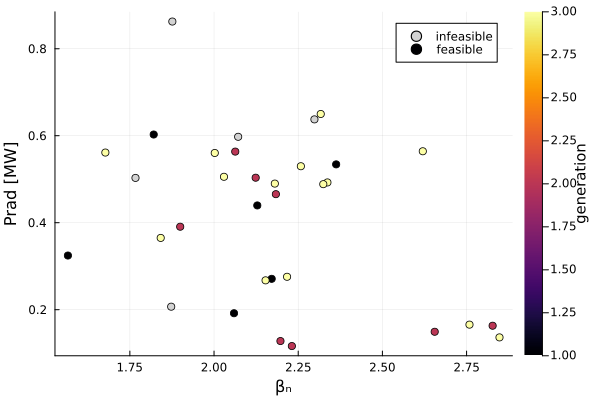

"/Users/tims/d3dsummerschool/runs/d3d_cmoop_summerschool/figures/objective_space_by_generation.png"

In [20]:
# NB: extract's Prad_tot follows the IMAS sink convention (negative) —
# flip the sign to plot radiated power in positive MW
p = scatter(infeasible.βn, -infeasible.Prad_tot;
    color=:lightgray, label="infeasible", xlabel="βₙ", ylabel="Prad [MW]")
scatter!(p, feasible.βn, -feasible.Prad_tot;
    zcolor=feasible.gen, colorbar_title="generation", label="feasible")
display(p)
savefig(p, joinpath(figdir, "objective_space_by_generation.png"))



## The Pareto front

FUSE.pareto_front expects "smaller is better", so negate what we maximize:


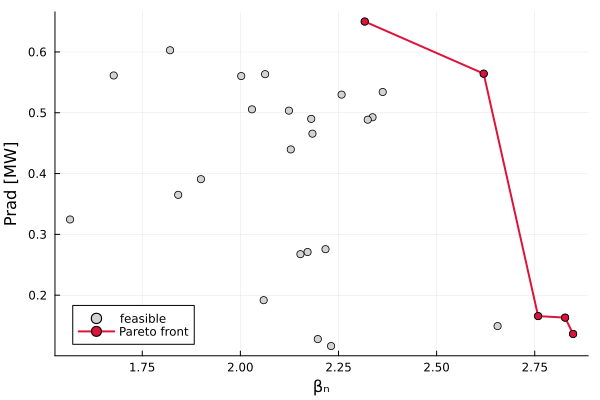

"/Users/tims/d3dsummerschool/runs/d3d_cmoop_summerschool/figures/pareto_front.png"

In [21]:
# maximize βₙ and maximize radiated power (= minimize the negative Prad_tot)
solutions = [[-row.βn, row.Prad_tot] for row in eachrow(feasible)]
ipareto = FUSE.pareto_front(solutions)
front = sort(feasible[ipareto, :], :βn)

p = scatter(feasible.βn, -feasible.Prad_tot; color=:lightgray, label="feasible", xlabel="βₙ", ylabel="Prad [MW]")
plot!(p, front.βn, -front.Prad_tot; marker=:circle, lw=2, color=:crimson, label="Pareto front")
display(p)
savefig(p, joinpath(figdir, "pareto_front.png"))



## How did it get there? Look at the actuators

Color the objective space by the knobs — this is where discoveries happen:


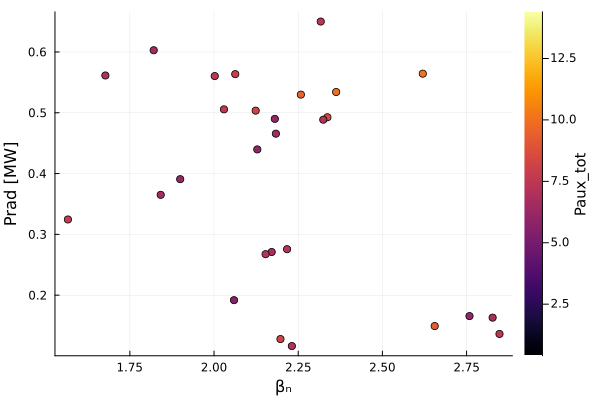

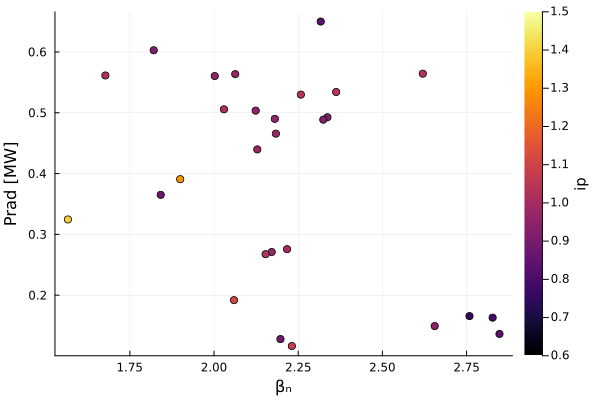

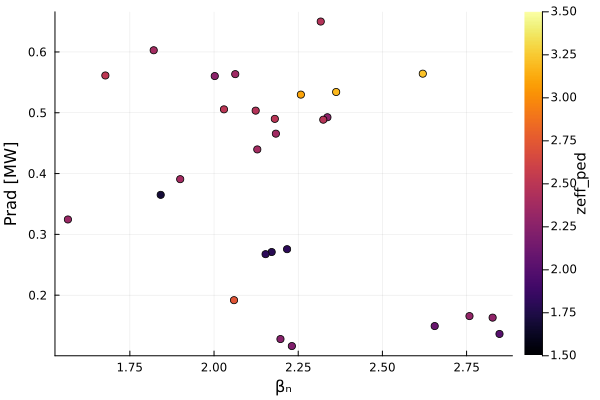

In [22]:
# colorbars clamped to the ranges we gave the optimizer
knob_ranges = [
    :Paux_tot => (0.4, 14.4),   # sum of the power gene bounds [MW]
    :ip => (0.6, 1.5),          # [MA]
    :zeff_ped => (1.5, 3.5),
]
for (knob, cl) in knob_ranges
    if String(knob) in names(feasible)
        local p = scatter(feasible.βn, -feasible.Prad_tot;
            zcolor=feasible[!, knob], clims=cl, colorbar_title=string(knob),
            xlabel="βₙ", ylabel="Prad [MW]", label="")
        display(p)
        savefig(p, joinpath(figdir, "objective_space_by_$(knob).png"))
    end
end


## Which knobs got us here? Recover the genes

The colorings above used *outputs* that mirror knobs. But the actual gene
values (e.g. the EC aiming ρ₀ — invisible in the outputs) live in each
case's stored `ini`. The database keeps everything: dd, ini, act, logs.


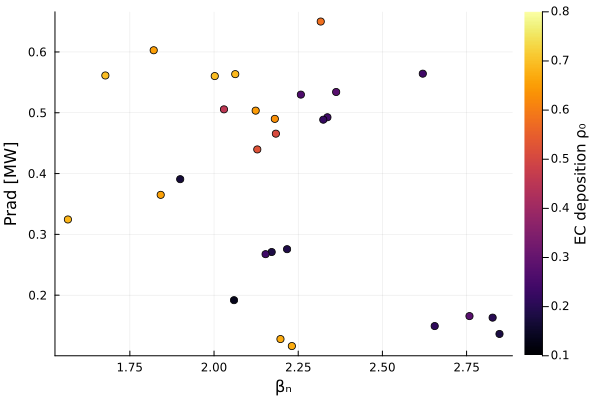

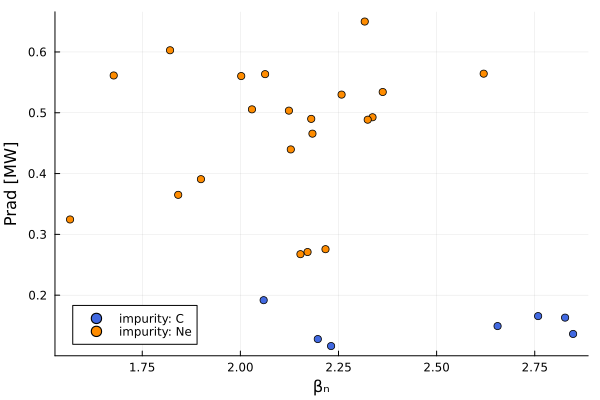

"/Users/tims/d3dsummerschool/runs/d3d_cmoop_summerschool/figures/objective_space_by_impurity.png"

In [23]:
db = FUSE.load_study_database(joinpath(folder, "database.h5"), String.(feasible.gparent); pattern=r"ini")
rho0 = [item.ini.ec_launcher[1].rho_0 for item in db.items]
p = scatter(feasible.βn, -feasible.Prad_tot;
    zcolor=rho0, clims=(0.1, 0.8), colorbar_title="EC deposition ρ₀",
    xlabel="βₙ", ylabel="Prad [MW]", label="")
display(p)
savefig(p, joinpath(figdir, "objective_space_by_ec_rho0.png"))

# ...and the categorical gene: which impurity did the optimizer pick where?
imp = [string(item.ini.core_profiles.impurity) for item in db.items]
p = plot(; xlabel="βₙ", ylabel="Prad [MW]")
for (species, color) in (("C", :royalblue), ("Ne", :darkorange))
    sel = imp .== species
    scatter!(p, feasible.βn[sel], -feasible.Prad_tot[sel]; color, label="impurity: $species")
end
display(p)
savefig(p, joinpath(figdir, "objective_space_by_impurity.png"))


## Deep-dive a single individual

Pick a Pareto-front point and reload the entire simulation:


best individual: /gen3/case13


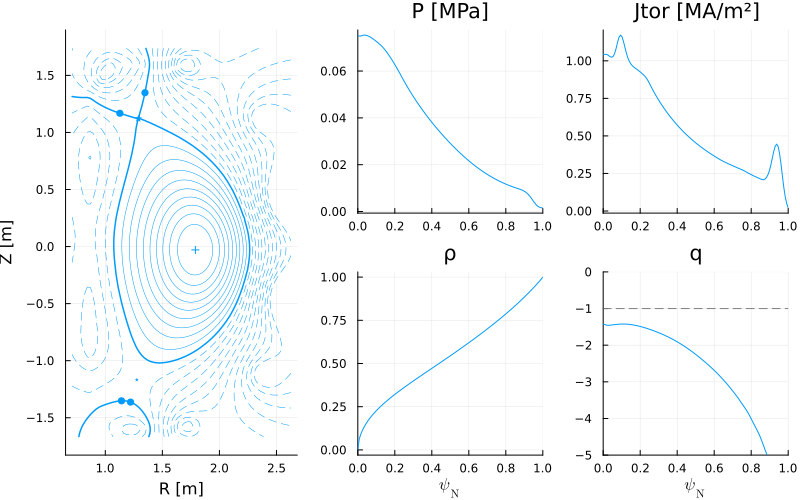

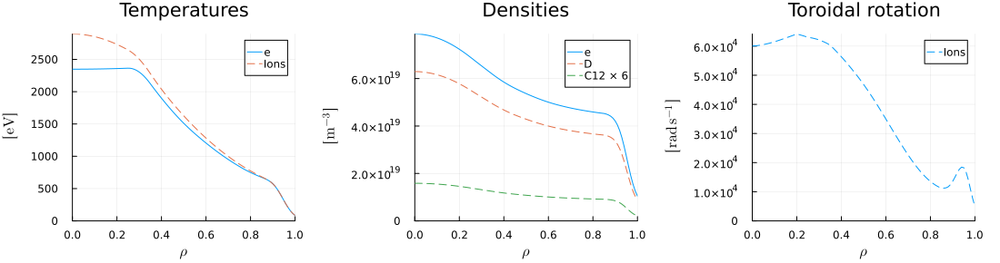

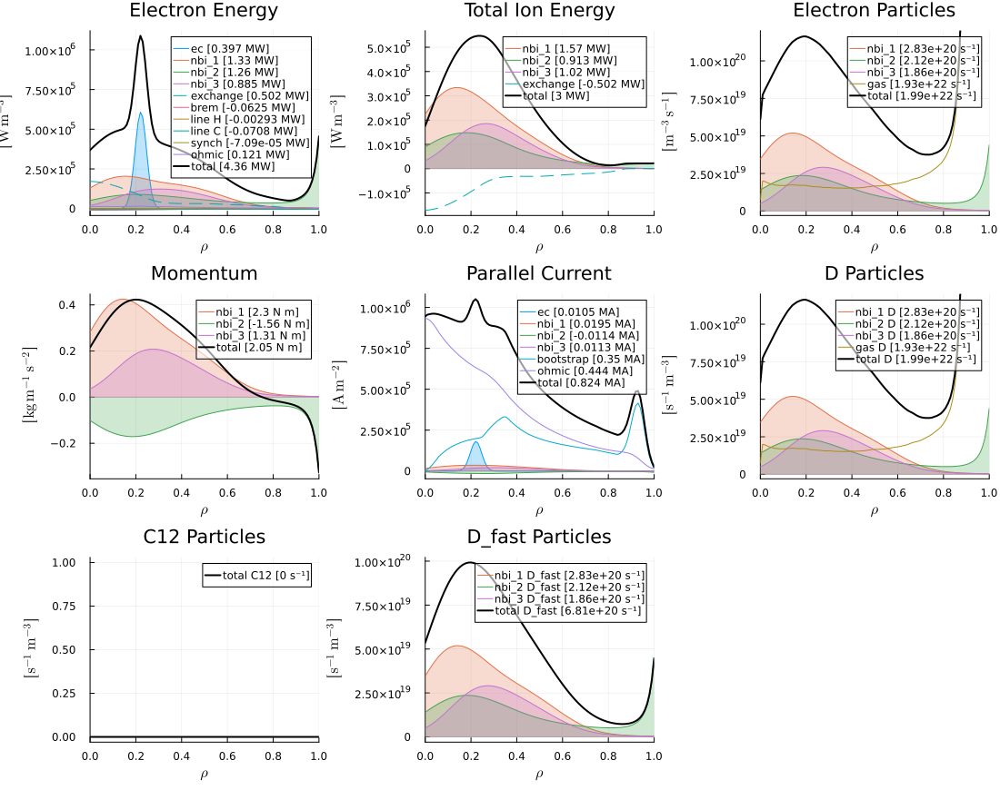

GEOMETRY                               EQUILIBRIUM                            TEMPERATURES                           
───────────────────────────────────    ───────────────────────────────────    ───────────────────────────────────    
R0 → 1.67 [m]                          B0 → -1.71 [T]                         Te0 → 2.35 [keV]                       
a → 0.599 [m]                          ip → 0.836 [MA]                        Ti0 → 2.89 [keV]                       
1/ϵ → 2.78                             q95 → -5.95                            <Te> → 1.19 [keV]                      
κ → 1.79                               <Bpol> → 0.192 [T]                     <Ti> → 1.28 [keV]                      
δ → 0.372                              βpol_MHD → 1.74                        Te0/<Te> → 1.97                        
ζ → -0.121                             βtor_MHD → 0.0234                      Ti0/<Ti> → 2.25                        
Volume → 18.9 [m³]                     βn_MHD → 2.84    

In [24]:
best = front[end, :]   # highest βₙ on the front
println("best individual: ", best.gparent)
db1 = FUSE.load_study_database(joinpath(folder, "database.h5"), String(best.gparent))
dd_best = db1.items[1].dd

p = plot(dd_best.equilibrium)
display(p)
savefig(p, joinpath(figdir, "best_equilibrium.png"))

p = plot(dd_best.core_profiles)
display(p)
savefig(p, joinpath(figdir, "best_core_profiles.png"))

p = plot(dd_best.core_sources)
display(p)
savefig(p, joinpath(figdir, "best_core_sources.png"))

IMAS.extract(dd_best)


# The audience challenge: beat the optimizer!

Pick the actuators yourself — inside the same ranges the optimizer had —
and let's see where YOUR shot lands in the objective space.

Run with:  julia --project=../FUSE


In [25]:
using Plots
using CSV
using DataFrames
using FUSE
import IMAS

include(joinpath(@__DIR__, "cmoop_definitions.jl"))



stable_troyon_nn < 1.0 [-]

## Your shot — pick values inside the optimizer's ranges!


In [40]:
ip       = 1.1E6      # plasma current [A]           range: [0.6E6, 1.5E6]
Pnbi_co  = 2.0E6      # co-current beam [W]          range: [0.1E6, 3.3E6]
Pnbi_ctr = 0.5E6      # counter-current beam [W]     range: [0.1E6, 3.3E6]
Pnbi_off = 1.0E6      # off-axis beam [W]            range: [0.1E6, 3.3E6]
Pec      = 3.0E6      # gyrotron power [W]           range: [0.1E6, 4.5E6]
ec_rho0  = 0.3        # EC deposition location ρ     range: [0.1, 0.8]
ne_ped   = 4.0e19     # pedestal density [m⁻³]       range: [3.5e19, 4.5e19]
zeff     = 2.0        # effective charge             range: [1.5, 3.5]
impurity = :C         # seeding impurity             choices: :C or :Ne
# (warning: dumping ALL the power into a low-current plasma is a good way
#  to disrupt — see note below)

:C

## Set up the same idealized DIII-D the optimizer used


In [41]:
ini, act = FUSE.case_parameters(:D3D, :default);

act.ActorPedestal.model = :EPED
act.ActorFluxMatcher.evolve_pedestal = false
act.ActorStationaryPlasma.max_iterations = 3
act.ActorPlasmaLimits.models = [:beta_troyon_nn]
act.ActorEquilibrium.model = :TEQUILA
act.ActorTGLF.tglfnn_model = "sat3_em_d3d+mastu+nstx_azf-1"

act.ActorStationaryPlasma.verbose = true

ini.equilibrium.ip = ip
ini.nb_unit[1].power_launched = Pnbi_co
ini.nb_unit[2].power_launched = Pnbi_ctr
ini.nb_unit[3].power_launched = Pnbi_off
ini.ec_launcher[1].power_launched = Pec
ini.ec_launcher[1].rho_0 = ec_rho0
ini.core_profiles.ne_setting = :ne_ped
ini.core_profiles.ne_value = ne_ped
ini.core_profiles.zeff = zeff
ini.core_profiles.impurity = impurity
ini.requirements.lh_power_threshold_fraction = 1.0



1.0

## Run it — exactly what the optimizer runs for every individual (~2 min)

NB: extreme picks (all the power into the lowest density...) can crash the
simulation — congratulations, you disrupted the plasma! Pick again ;)
(the optimizer hits these corners too — those individuals just get marked
 as failed and it moves on)


In [42]:
dd = d3d_stationary_workflow(ini, act);



Progress: 100%|███████████████████████████| Time: 0:01:09 ( 2.68  s/it)
            iteration (min 2): 3/3
   required convergence error: 0.05
          convergence history: [0.10338815417441714, 0.15765097572780387, 0.26937162755320804]
                        stage: N/A
                      Ip [MA]: 1.082727696093039
                    Ti0 [keV]: 1.5256322533190432
                    Te0 [keV]: 1.5935779957609266
               ne0 [10²⁰ m⁻³]: 0.6222401316601909
                    max(zeff): 1.9971016770851704
                  ω0 [krad/s]: 60.0
actors: PlasmaLimits
actors:  TroyonBetaNN


## Where did you land?


In [43]:
βn_you = dd.equilibrium.time_slice[].global_quantities.beta_normal
prad_you = -IMAS.radiation_losses(dd.core_sources) / 1E6

troyon_you = maximum([IMAS.@ddtime(model.fraction) for model in dd.limits.model if startswith(model.identifier.name, "BetaTroyonNN")]; init=0.0)
transport_error_you = IMAS.@ddtime(dd.transport_solver_numerics.convergence.time_step.data)

println("your shot:  βₙ = ", round(βn_you; digits=2), "   Prad = ", round(prad_you; digits=2), " MW")
println("stability:  βₙ/βₙ_limit(NN) = ", round(troyon_you; digits=2), troyon_you < 1 ? "  ✔ stable" : "  ✘ UNSTABLE")
println("converged:  transport error = ", round(transport_error_you; digits=3), transport_error_you < 0.1 ? "  ✔" : "  ✘ not converged")



your shot:  βₙ = 1.9   Prad = 0.12 MW
stability:  βₙ/βₙ_limit(NN) = 0.62  ✔ stable
converged:  transport error = 0.026  ✔


## ...and against the optimizer's database


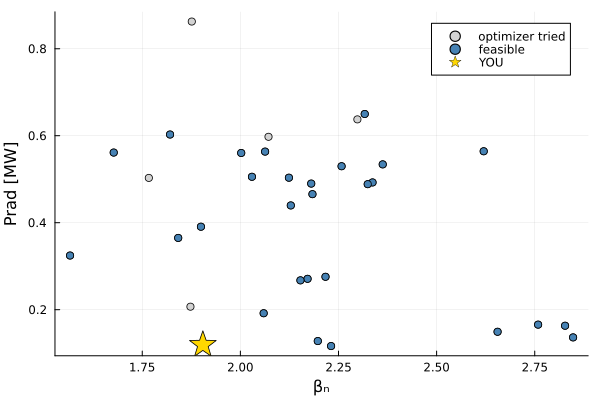

"/Users/tims/d3dsummerschool/runs/audience_challenge.png"

In [44]:
folder = joinpath(@__DIR__, "..", "runs", "d3d_cmoop_summerschool")   # or d3d_cmoop_big!
df = CSV.read(joinpath(folder, "extract.csv"), DataFrame)

constraints = [:max_transport_error, :min_lh_power_threshold_fraction, :stable_troyon_nn]
ok = df.status .== "success"
for c in constraints
    global ok .&= coalesce.(df[!, c] .== 0.0, false)
end

p = scatter(df.βn[df.status.=="success"], -df.Prad_tot[df.status.=="success"];
    color=:lightgray, label="optimizer tried", xlabel="βₙ", ylabel="Prad [MW]")
scatter!(p, df.βn[ok], -df.Prad_tot[ok]; color=:steelblue, label="feasible")
scatter!(p, [βn_you], [prad_you]; marker=:star5, markersize=14,
    color=troyon_you < 1 ? :gold : :red, label="YOU")
display(p)
savefig(p, joinpath(@__DIR__, "..", "runs", "audience_challenge.png"))


## More data more better — the same CMOOP at scale

The exact same study, run overnight on a server with a sysimage
(population 200 × 20 generations, 10 workers): **~7,800 evaluations instead of our 40**.
More data more better :)


server run: 7855 cases, 4274 feasible  (laptop: 40 / 28)


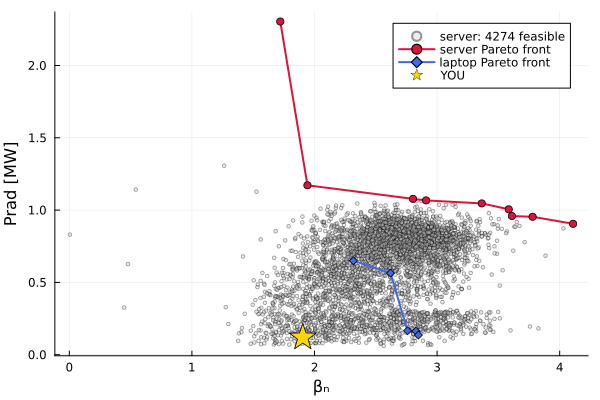

"/Users/tims/d3dsummerschool/runs/d3d_cmoop_summerschool/figures/pareto_laptop_vs_server.png"

In [45]:
folder_big = joinpath(@__DIR__, "..", "runs", "d3d_cmoop_big")
df_big = CSV.read(joinpath(folder_big, "extract.csv"), DataFrame)

ok_big = df_big.status .== "success"
for c in constraints
    global ok_big .&= coalesce.(df_big[!, c] .== 0.0, false)
end
feas_big = df_big[ok_big, :]
println("server run: ", nrow(df_big), " cases, ", nrow(feas_big), " feasible  (laptop: ", nrow(df), " / ", nrow(feasible), ")")

sol_big = [[-row.βn, row.Prad_tot] for row in eachrow(feas_big)]
front_big = sort(feas_big[FUSE.pareto_front(sol_big), :], :βn)

p = scatter(feas_big.βn, -feas_big.Prad_tot; color=:lightgray, ms=2, malpha=0.4,
    label="server: $(nrow(feas_big)) feasible", xlabel="βₙ", ylabel="Prad [MW]")
plot!(p, front_big.βn, -front_big.Prad_tot; marker=:circle, lw=2, color=:crimson,
    label="server Pareto front")
plot!(p, front.βn, -front.Prad_tot; marker=:diamond, lw=2, color=:royalblue,
    label="laptop Pareto front")
scatter!(p, [βn_you], [prad_you]; marker=:star5, markersize=14,
    color=troyon_you < 1 ? :gold : :red, label="YOU")
display(p)
savefig(p, joinpath(figdir, "pareto_laptop_vs_server.png"))


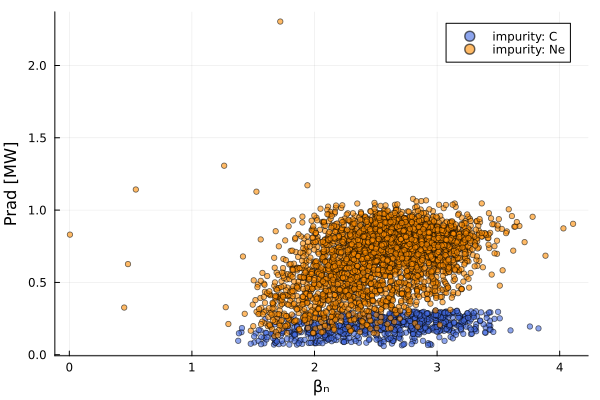

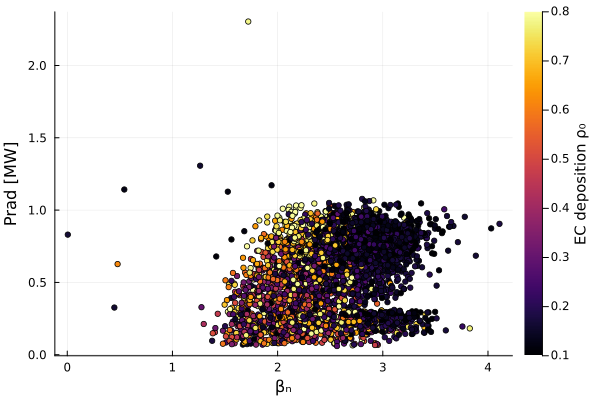

"/Users/tims/d3dsummerschool/runs/d3d_cmoop_summerschool/figures/objective_space_by_ec_rho0_big.png"

In [46]:
# the genes of the big run (extracted from the per-case inis in its database):
genes = CSV.read(joinpath(folder_big, "genes_big.csv"), DataFrame)
big = leftjoin(feas_big, genes; on=:gparent)

p = plot(; xlabel="βₙ", ylabel="Prad [MW]")
for (species, color) in (("C", :royalblue), ("Ne", :darkorange))
    sel = coalesce.(big.impurity .== species, false)
    scatter!(p, big.βn[sel], -big.Prad_tot[sel]; color, ms=3, malpha=0.6, label="impurity: $species")
end
display(p)
savefig(p, joinpath(figdir, "objective_space_by_impurity_big.png"))

p = scatter(big.βn, -big.Prad_tot; zcolor=big.ec_rho0, clims=(0.1, 0.8), ms=3,
    colorbar_title="EC deposition ρ₀", xlabel="βₙ", ylabel="Prad [MW]", label="")
display(p)
savefig(p, joinpath(figdir, "objective_space_by_ec_rho0_big.png"))


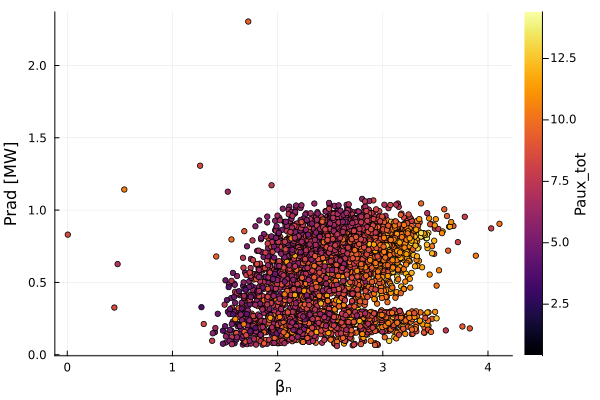

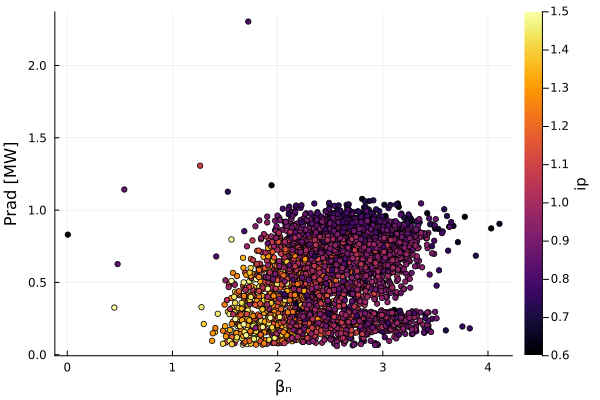

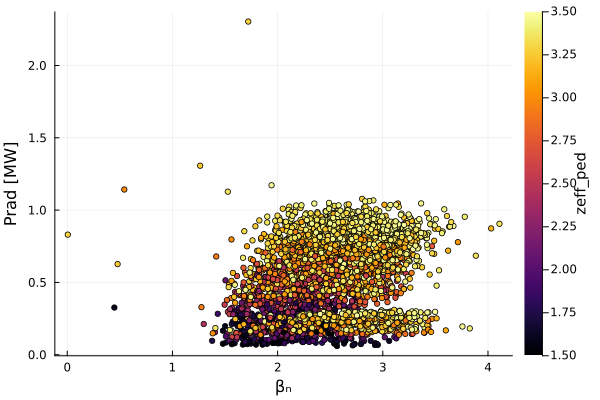

In [47]:
# all the actuator views, now on the full dataset
for (knob, cl) in knob_ranges
    if String(knob) in names(feas_big)
        local p = scatter(feas_big.βn, -feas_big.Prad_tot;
            zcolor=feas_big[!, knob], clims=cl, ms=3, colorbar_title=string(knob),
            xlabel="βₙ", ylabel="Prad [MW]", label="")
        display(p)
        savefig(p, joinpath(figdir, "objective_space_by_$(knob)_big.png"))
    end
end


# The new age: physics models as public web APIs

EPED-NN (the same pedestal model the CMOOP used through ActorPedestal)
is served as a public API at https://iter.fuseexplorer.com/EPED — no
FUSE installation, no Julia, no GA account. Just HTTP.

Browse it:      https://iter.fuseexplorer.com/EPED     (interactive explorer)
Self-docs:      curl -s https://iter.fuseexplorer.com/EPED/api

Run with:  julia --project=../FUSE   (only needs JSON + Plots + curl)


In [34]:
import JSON
using Plots



## The API documents itself


In [48]:
api_docs = JSON.parse(read(`curl -s https://iter.fuseexplorer.com/EPED/api`, String))
println(api_docs["description"], "\n")
for (name, spec) in api_docs["inputs"]
    println(rpad(name, 14), rpad(spec["unit"], 10), rpad(join(spec["range"], " … "), 14), spec["description"])
end



EPED-NN surrogate: predicts the H-mode pedestal height (total pressure) for a tokamak operating point, with an ensemble (5-network) uncertainty.

a             m         0.5 … 2.0     minor radius
betan         -         0.5 … 4       normalized beta, betaN
bt            T         2 … 8         vacuum toroidal magnetic field
delta         -         0.1 … 0.65    triangularity (delta95)
ip            MA        8 … 15        plasma current
kappa         -         1.2 … 2.5     elongation (kappa95)
m             amu       1 … 2.5       main ion mass (2.0=D, 2.5=DT)
neped         1e19 m^-3 1 … 20        pedestal-top electron density
nesep_ratio   -         0.05 … 0.6    separatrix-to-pedestal density ratio, ne_sep/ne_ped
r             m         1.5 … 7       major radius
tesep         eV        70 … 200      separatrix electron temperature
zeffped       -         0.8 … 4       effective charge at the pedestal, Zeff


## One prediction = one POST


In [49]:
function eped_predict(; kw...)
    payload = JSON.json(Dict(kw...))
    return JSON.parse(read(`curl -s https://iter.fuseexplorer.com/EPED/predict -H "Content-Type: application/json" -d $payload`, String))
end

# a DIII-D-like point:
d3d = (a=0.56, betan=2.0, bt=2.0, delta=0.5, ip=1.0, kappa=1.8, m=2.0,
    neped=5.0, nesep_ratio=0.25, r=1.67, tesep=75.0, zeffped=2.0)
println(eped_predict(; d3d...))

# an ITER-like point:
iter = (a=2.0, betan=2.0, bt=5.3, delta=0.49, ip=15.0, kappa=1.85, m=2.5,
    neped=7.0, nesep_ratio=0.25, r=6.2, tesep=75.0, zeffped=1.5)
println(eped_predict(; iter...))



JSON.Object{String, Any}("pedestal_height_kPa" => 13.71, "uncertainty_kPa" => 0.15, "diamagnetic_model" => "H")
JSON.Object{String, Any}("pedestal_height_kPa" => 78.02, "uncertainty_kPa" => 0.52, "diamagnetic_model" => "H")


## Parameter scans against a live model

This is the point: a scan that used to require an account on a cluster
and a batch queue is now a for-loop over HTTP.


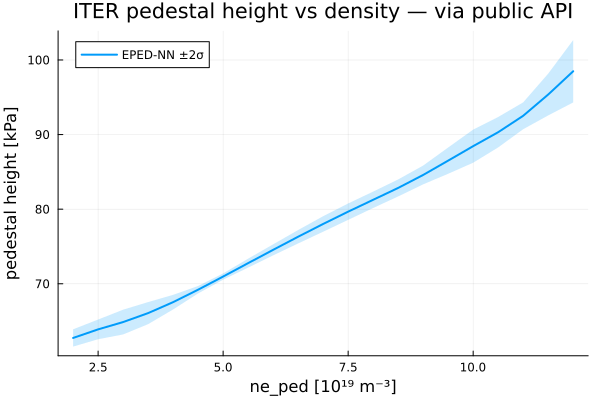

In [50]:
nepeds = 2.0:0.5:12.0
results = [eped_predict(; iter..., neped) for neped in nepeds]
height = [r["pedestal_height_kPa"] for r in results]
σ = [r["uncertainty_kPa"] for r in results]

display(plot(nepeds, height; ribbon=2σ, fillalpha=0.2, lw=2, label="EPED-NN ±2σ",
    xlabel="ne_ped [10¹⁹ m⁻³]", ylabel="pedestal height [kPa]",
    title="ITER pedestal height vs density — via public API"))



## Trust, but verify: uncertainty grows out of distribution

The docs give the training range for each input. Walk βₙ beyond it and
watch the ensemble spread — the model tells you when to stop trusting it:


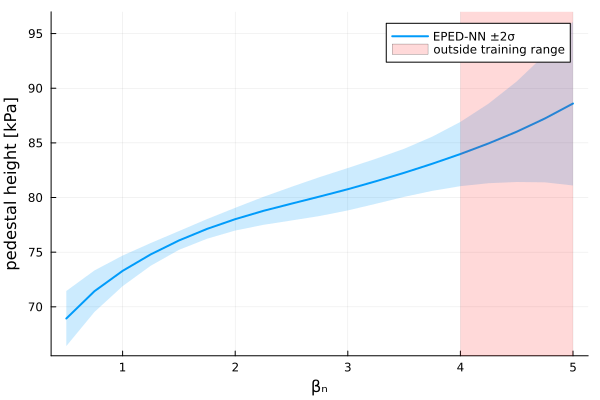

In [51]:
betans = 0.5:0.25:5.0
results = [eped_predict(; iter..., betan) for betan in betans]
height = [r["pedestal_height_kPa"] for r in results]
σ = [r["uncertainty_kPa"] for r in results]

p = plot(betans, height; ribbon=2σ, fillalpha=0.2, lw=2, label="EPED-NN ±2σ",
    xlabel="βₙ", ylabel="pedestal height [kPa]")
vspan!(p, [4.0, 5.0]; alpha=0.15, color=:red, label="outside training range")
display(p)


In [52]:
ip       = 1.1E6      # plasma current [A]           range: [0.6E6, 1.5E6]
Pnbi_co  = 2.0E6      # co-current beam [W]          range: [0.1E6, 3.3E6]
Pnbi_ctr = 0.5E6      # counter-current beam [W]     range: [0.1E6, 3.3E6]
Pnbi_off = 1.0E6      # off-axis beam [W]            range: [0.1E6, 3.3E6]
Pec      = 3.0E6      # gyrotron power [W]           range: [0.1E6, 4.5E6]
ec_rho0  = 0.3        # EC deposition location ρ     range: [0.1, 0.8]
ne_ped   = 4.0e19     # pedestal density [m⁻³]       range: [3.5e19, 4.5e19]
zeff     = 2.0        # effective charge             range: [1.5, 3.5]
impurity = :C         # seeding impurity             choices: :C or :Ne
# (warning: dumping ALL the power into a low-current plasma is a good way
#  to disrupt — see note below)

# Remember we are maximizing beta_normal and Prad


:C